# Utilization of libraries

In [1]:
!pip install hvplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 27.5 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Loading of Dataset

In [3]:
#data=pd.read_csv("./TSCO.L.csv")

In [4]:
from google.colab import files

uploaded = files.upload()

Saving TSCO.L.csv to TSCO.L.csv


In [5]:
import io
 
data = pd.read_csv(io.BytesIO(uploaded['TSCO.L.csv']))
print(data)

            Date        Open        High         Low       Close   Adj Close  \
0     1988-07-01   62.685600   62.685600   62.685600   62.685600   22.445370   
1     1988-07-04   61.456402   61.456402   61.456402   61.456402   22.005232   
2     1988-07-05   62.275902   62.275902   62.275902   62.275902   22.298670   
3     1988-07-06   61.456402   61.456402   61.456402   61.456402   22.005232   
4     1988-07-07   60.227299   60.227299   60.227299   60.227299   21.565132   
...          ...         ...         ...         ...         ...         ...   
8938  2023-04-24  278.500000  279.600006  276.600006  278.100006  278.100006   
8939  2023-04-25  277.100006  279.700012  276.500000  278.299988  278.299988   
8940  2023-04-26  277.000000  280.299988  275.799988  279.600006  279.600006   
8941  2023-04-27  280.799988  281.799988  278.325012  278.700012  278.700012   
8942  2023-04-28  278.399994  282.200012  278.000000  281.100006  281.100006   

          Volume  
0            0.0  
1

# Overviewing of data

In [6]:
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,1988-07-01,62.685600,62.685600,62.685600,62.685600,22.445370,0.0
1,1988-07-04,61.456402,61.456402,61.456402,61.456402,22.005232,0.0
2,1988-07-05,62.275902,62.275902,62.275902,62.275902,22.298670,0.0
3,1988-07-06,61.456402,61.456402,61.456402,61.456402,22.005232,0.0
4,1988-07-07,60.227299,60.227299,60.227299,60.227299,21.565132,0.0
...,...,...,...,...,...,...,...
8938,2023-04-24,278.500000,279.600006,276.600006,278.100006,278.100006,9788205.0
8939,2023-04-25,277.100006,279.700012,276.500000,278.299988,278.299988,11672810.0
8940,2023-04-26,277.000000,280.299988,275.799988,279.600006,279.600006,12632291.0
8941,2023-04-27,280.799988,281.799988,278.325012,278.700012,278.700012,10623684.0


# Exploratory Data Analysis

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8943 entries, 0 to 8942
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       8943 non-null   object 
 1   Open       8942 non-null   float64
 2   High       8942 non-null   float64
 3   Low        8942 non-null   float64
 4   Close      8942 non-null   float64
 5   Adj Close  8942 non-null   float64
 6   Volume     8942 non-null   float64
dtypes: float64(6), object(1)
memory usage: 489.2+ KB


In [8]:
data.shape

(8943, 7)

In [9]:
data.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume       float64
dtype: object

In [10]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,8942.000000,8942.000000,8942.000000,8942.000000,8942.000000,8.942000e+03
mean,278.222083,281.024556,275.275864,278.116840,160.644072,2.424330e+07
std,141.396980,143.082533,139.595053,141.311557,93.567165,3.578588e+07
min,52.852501,52.852501,52.852501,52.852501,18.924492,0.000000e+00
25%,146.352672,146.352672,146.352672,146.352672,60.159852,8.426353e+06
50%,266.443146,270.433197,262.816589,266.250000,160.447235,1.686132e+07
75%,393.299805,397.505157,389.499786,392.983093,241.102863,2.715343e+07
max,624.466370,626.049683,614.333008,623.199707,335.323761,8.602839e+08


In [11]:
data.size

62601

### Checking for Null Values

In [12]:
data.isnull().sum()

Date         0
Open         1
High         1
Low          1
Close        1
Adj Close    1
Volume       1
dtype: int64

In [26]:
data=data.dropna()

# Visualizing Procedure

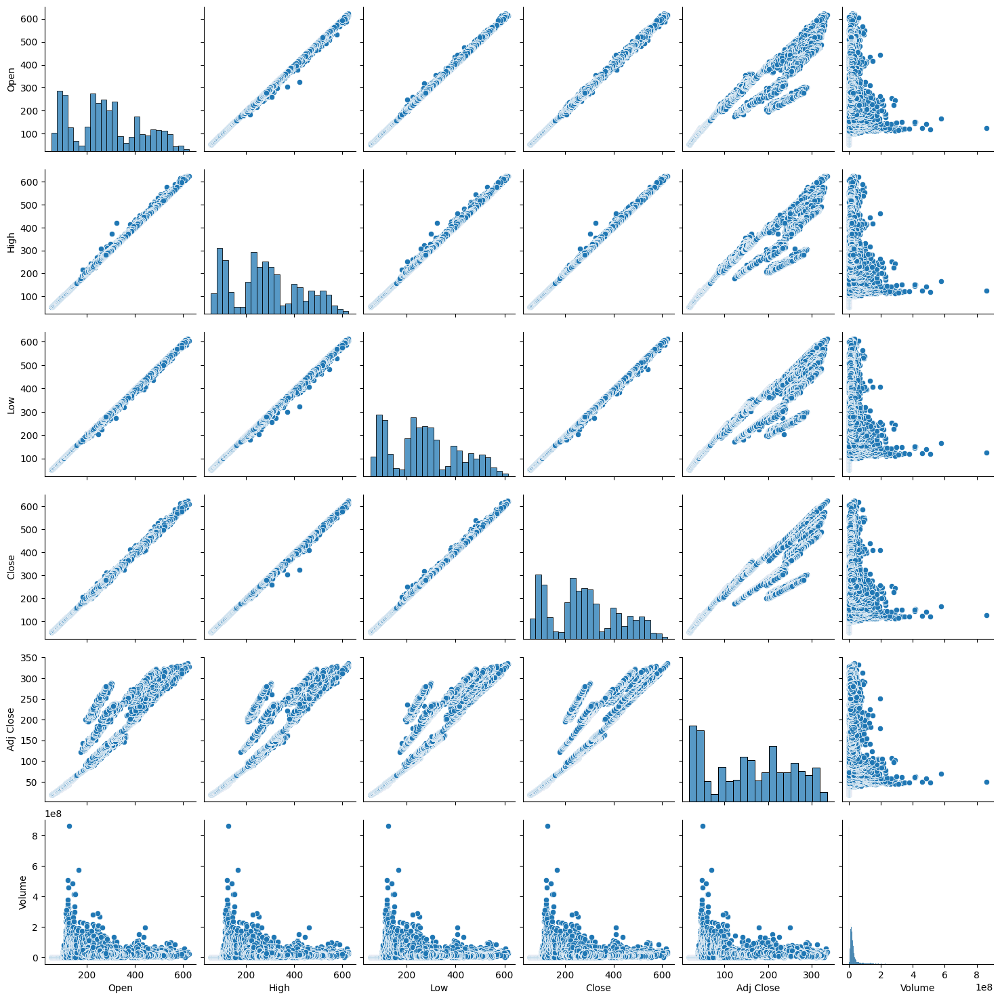

In [27]:
sns.pairplot(data)

In [28]:
data.hvplot.hist(by='Volume', subplots=False, width=1000)

:NdOverlay   [Element]
   :Histogram   [Adj Close]   (Adj Close_count)

In [29]:
data.hvplot.scatter(x='Open', y='Volume')

:Scatter   [Open]   (Volume)

# Correletion analysis

<Axes: >

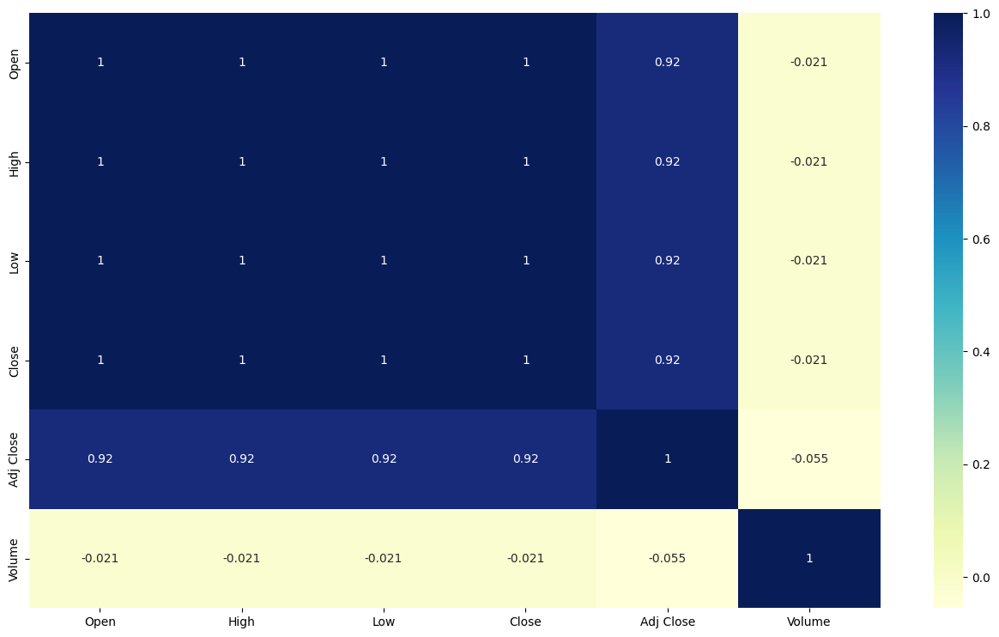

In [30]:
plt.figure(figsize=(16,9))
sns.heatmap(data.corr(), annot = True, cmap="YlGnBu")

# Initialtion of Machine Learning Method

In [31]:
X = data.drop(["Date", "Volume"],axis=1)
y = data[['Volume']]

## Splitting of Variable

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Model Development

In [33]:
from sklearn import metrics
from sklearn.model_selection import cross_val_score

def cross_val(model):
    pred = cross_val_score(model, X, y, cv=10)
    return pred.mean()

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')
    
def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return mae, mse, rmse, r2_square

### Model Pipelining and Standard Scaler

In [34]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
pipeline = Pipeline([('std_scalar', StandardScaler())])
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

# Implementing Linear Regression

In [35]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(X_train,y_train)

LinearRegression()

In [36]:
print(lin_reg.intercept_)

[24523899.21153539]


### Predicting data

In [37]:
pred = lin_reg.predict(X_test)

### Obtaining accuracy of the model

In [38]:
test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df = pd.DataFrame(data=[["Linear Regression", *evaluate(y_test, test_pred) , cross_val(LinearRegression())]], 
                          columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

Test set evaluation:
_____________________________________
MAE: 18875528.231013168
MSE: 1147988839702943.2
RMSE: 33881983.998918116
R2 Square 0.007876089088647897
__________________________________
Train set evaluation:
_____________________________________
MAE: 19053362.073560383
MSE: 1320746247238338.8
RMSE: 36342072.68770369
R2 Square 0.009276880064270077
__________________________________


### Implementing Robust Regression

In [39]:
from sklearn.linear_model import RANSACRegressor
model = RANSACRegressor(base_estimator=LinearRegression(), max_trials=100)
model.fit(X_train, y_train)

RANSACRegressor(base_estimator=LinearRegression(), estimator=LinearRegression())

### Prediction of data

In [40]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

### Obtaining accuracy of the model

In [41]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Robust Regression", *evaluate(y_test, test_pred) , cross_val(RANSACRegressor())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

Test set evaluation:
_____________________________________
MAE: 16837159.55845089
MSE: 1461643784412499.0
RMSE: 38231450.20022781
R2 Square -0.2631932450892447
__________________________________
Train set evaluation:
_____________________________________
MAE: 17506538.485444415
MSE: 1679073998097613.2
RMSE: 40976505.440283865
R2 Square -0.25951327401200364
__________________________________


In [46]:
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499


### Implementing Ridge Regression

In [42]:
from sklearn.linear_model import Ridge
model = Ridge(alpha=100, solver='cholesky', tol=0.0001, random_state=42)
model.fit(X_train, y_train)

Ridge(alpha=100, random_state=42, solver='cholesky')

### Prediction of data

In [43]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

### Obtaining accuracy of the model

In [44]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_3 = pd.DataFrame(data=[["Ridge Regression", *evaluate(y_test, test_pred) , cross_val(Ridge())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

Test set evaluation:
_____________________________________
MAE: 18859007.292996615
MSE: 1148335468200799.0
RMSE: 33887098.84603282
R2 Square 0.0075765230919828674
__________________________________
Train set evaluation:
_____________________________________
MAE: 19020815.50800789
MSE: 1321168609460791.5
RMSE: 36347883.14965249
R2 Square 0.008960056132613081
__________________________________


In [45]:
results_df = results_df.append(results_df_3, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702


# Implementing LASSO Regression

In [47]:
from sklearn.linear_model import Lasso
model = Lasso(alpha=0.1, 
              precompute=True,
              positive=True, 
              selection='random',
              random_state=42)
model.fit(X_train, y_train)

Lasso(alpha=0.1, positive=True, precompute=True, random_state=42,
      selection='random')

### Prediction of data

In [48]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

### Obtaining accuracy of the model

In [49]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)
results_df_4 = pd.DataFrame(data=[["Lasso Regression", *evaluate(y_test, test_pred) , cross_val(Lasso())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

Test set evaluation:
_____________________________________
MAE: 18913641.952771105
MSE: 1157976892966077.0
RMSE: 34029059.53690282
R2 Square -0.0007558645707406164
__________________________________
Train set evaluation:
_____________________________________
MAE: 19030456.495270196
MSE: 1333113380178326.8
RMSE: 36511825.2101744
R2 Square 0.0
__________________________________


In [50]:
results_df = results_df.append(results_df_4, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499
3,Lasso Regression,1.891364e+07,1.157977e+15,3.402906e+07,-0.000756,-2.007538


# Implementing Elastic Net

In [51]:
from sklearn.linear_model import ElasticNet
model = ElasticNet(alpha=0.1, l1_ratio=0.9, selection='random', random_state=42)
model.fit(X_train, y_train)

ElasticNet(alpha=0.1, l1_ratio=0.9, random_state=42, selection='random')

### Prediction of data

In [52]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

### Obtaining accuracy of the model

In [53]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_5 = pd.DataFrame(data=[["Elastic Net Regression", *evaluate(y_test, test_pred) , cross_val(ElasticNet())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

Test set evaluation:
_____________________________________
MAE: 18867310.927503683
MSE: 1148242119652155.8
RMSE: 33885721.47161922
R2 Square 0.007657197506188651
__________________________________
Train set evaluation:
_____________________________________
MAE: 19030923.81178831
MSE: 1321082576306576.2
RMSE: 36346699.66182041
R2 Square 0.00902459164436653
__________________________________


In [54]:
results_df = results_df.append(results_df_5, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499
3,Lasso Regression,1.891364e+07,1.157977e+15,3.402906e+07,-0.000756,-2.007538
4,Elastic Net Regression,1.886731e+07,1.148242e+15,3.388572e+07,0.007657,-2.006850


# Implementing Stochastic Gradient Descent

In [55]:
from sklearn.linear_model import SGDRegressor
sgd_reg = SGDRegressor(n_iter_no_change=250, penalty=None, eta0=0.0001, max_iter=100000)
sgd_reg.fit(X_train, y_train)

SGDRegressor(eta0=0.0001, max_iter=100000, n_iter_no_change=250, penalty=None)

### Prediction of data

In [56]:
test_pred = sgd_reg.predict(X_test)
train_pred = sgd_reg.predict(X_train)

### Obtaining accuracy of the model

In [57]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_6 = pd.DataFrame(data=[["Stochastic Gradient Descent", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])

Test set evaluation:
_____________________________________
MAE: 18888734.634964626
MSE: 1148166551280041.2
RMSE: 33884606.405859895
R2 Square 0.007722505796905921
__________________________________
Train set evaluation:
_____________________________________
MAE: 19053455.14782169
MSE: 1321015589429635.5
RMSE: 36345778.151384175
R2 Square 0.009074840091300329
__________________________________


In [58]:
results_df = results_df.append(results_df_6, ignore_index=True)

In [59]:
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499
3,Lasso Regression,1.891364e+07,1.157977e+15,3.402906e+07,-0.000756,-2.007538
4,Elastic Net Regression,1.886731e+07,1.148242e+15,3.388572e+07,0.007657,-2.006850
5,Stochastic Gradient Descent,1.888873e+07,1.148167e+15,3.388461e+07,0.007723,0.000000


# Implementing Random Forest Regressor

In [60]:
from sklearn.ensemble import RandomForestRegressor
rf_reg = RandomForestRegressor(n_estimators=1000)
rf_reg.fit(X_train, y_train)

RandomForestRegressor(n_estimators=1000)

### Prediction of data

In [61]:
test_pred = rf_reg.predict(X_test)
train_pred = rf_reg.predict(X_train)

### Obtaining accuracy of the model

In [62]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_7 = pd.DataFrame(data=[["Random Forest Regressor", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])

Test set evaluation:
_____________________________________
MAE: 10624486.626909448
MSE: 660592619013758.9
RMSE: 25701996.40132569
R2 Square 0.429097470264002
__________________________________
Train set evaluation:
_____________________________________
MAE: 5146239.732721518
MSE: 270298993103370.03
RMSE: 16440772.278192105
R2 Square 0.7972423072768102
__________________________________


In [63]:
results_df = results_df.append(results_df_7, ignore_index=True)
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499
3,Lasso Regression,1.891364e+07,1.157977e+15,3.402906e+07,-0.000756,-2.007538
4,Elastic Net Regression,1.886731e+07,1.148242e+15,3.388572e+07,0.007657,-2.006850
5,Stochastic Gradient Descent,1.888873e+07,1.148167e+15,3.388461e+07,0.007723,0.000000
6,Random Forest Regressor,1.062449e+07,6.605926e+14,2.570200e+07,0.429097,0.000000


# Implementing Support Vector Machine

In [64]:
from sklearn.svm import SVR
svm_reg = SVR(kernel='rbf', C=1000000, epsilon=0.001)
svm_reg.fit(X_train, y_train)

SVR(C=1000000, epsilon=0.001)

### Prediction of data

In [65]:
test_pred = svm_reg.predict(X_test)
train_pred = svm_reg.predict(X_train)

### Obtaining accuracy of the model

In [66]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)
results_df_8 = pd.DataFrame(data=[["SVM Regressor", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])

Test set evaluation:
_____________________________________
MAE: 13651013.855728673
MSE: 1223997075562116.8
RMSE: 34985669.57430023
R2 Square -0.05781234412085001
__________________________________
Train set evaluation:
_____________________________________
MAE: 14240808.06156282
MSE: 1432698679688550.8
RMSE: 37851006.32332713
R2 Square -0.07470129772225587
__________________________________


In [67]:
results_df = results_df.append(results_df_8, ignore_index=True)

In [68]:
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499
3,Lasso Regression,1.891364e+07,1.157977e+15,3.402906e+07,-0.000756,-2.007538
4,Elastic Net Regression,1.886731e+07,1.148242e+15,3.388572e+07,0.007657,-2.006850
5,Stochastic Gradient Descent,1.888873e+07,1.148167e+15,3.388461e+07,0.007723,0.000000
6,Random Forest Regressor,1.062449e+07,6.605926e+14,2.570200e+07,0.429097,0.000000
7,SVM Regressor,1.365101e+07,1.223997e+15,3.498567e+07,-0.057812,0.000000


Implementing Polynomial Regression

In [69]:
from sklearn.preprocessing import PolynomialFeatures
poly_reg = PolynomialFeatures(degree=2)
X_train_2_d = poly_reg.fit_transform(X_train)
X_test_2_d = poly_reg.transform(X_test)

In [71]:
lin_reg = LinearRegression()
lin_reg.fit(X_train_2_d,y_train)

LinearRegression()

In [72]:
test_pred = lin_reg.predict(X_test_2_d)
train_pred = lin_reg.predict(X_train_2_d)

In [73]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_9 = pd.DataFrame(data=[["Polynomail Regression", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])

Test set evaluation:
_____________________________________
MAE: 18277005.19326547
MSE: 1051694141999800.8
RMSE: 32429834.134632893
R2 Square 0.0910966473215915
__________________________________
Train set evaluation:
_____________________________________
MAE: 18035545.32832838
MSE: 1200619337816039.8
RMSE: 34649954.36960978
R2 Square 0.09938692712285546
__________________________________


In [74]:
results_df = results_df.append(results_df_9, ignore_index=True)

In [75]:
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499
3,Lasso Regression,1.891364e+07,1.157977e+15,3.402906e+07,-0.000756,-2.007538
4,Elastic Net Regression,1.886731e+07,1.148242e+15,3.388572e+07,0.007657,-2.006850
5,Stochastic Gradient Descent,1.888873e+07,1.148167e+15,3.388461e+07,0.007723,0.000000
6,Random Forest Regressor,1.062449e+07,6.605926e+14,2.570200e+07,0.429097,0.000000
7,SVM Regressor,1.365101e+07,1.223997e+15,3.498567e+07,-0.057812,0.000000
8,Polynomail Regression,1.827701e+07,1.051694e+15,3.242983e+07,0.091097,0.000000


Implementing Artficial Neural Network

In [76]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation, Dropout
from tensorflow.keras.optimizers import Adam
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [77]:
model = Sequential()

model.add(Dense(X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
# model.add(Dropout(0.2))

model.add(Dense(64, activation='relu'))
# model.add(Dropout(0.2))

model.add(Dense(128, activation='relu'))
# model.add(Dropout(0.2))

model.add(Dense(512, activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(1))

model.compile(optimizer=Adam(0.00001), loss='mse')

In [78]:
r = model.fit(X_train, y_train,
              validation_data=(X_test,y_test),
              batch_size=1,
              epochs=100)

Epoch 1/100
6259/6259 [==============================] - 27s 4ms/step - loss: 1934530847965184.0000 - val_loss: 1713529413435392.0000
Epoch 2/100
6259/6259 [==============================] - 23s 4ms/step - loss: 1934524942385152.0000 - val_loss: 1713513709961216.0000
Epoch 3/100
6259/6259 [==============================] - 25s 4ms/step - loss: 1934485348155392.0000 - val_loss: 1713447406403584.0000
Epoch 4/100
6259/6259 [==============================] - 24s 4ms/step - loss: 1934353277911040.0000 - val_loss: 1713220712660992.0000
Epoch 5/100
6259/6259 [==============================] - 25s 4ms/step - loss: 1933946598195200.0000 - val_loss: 1712614316965888.0000
Epoch 6/100
6259/6259 [==============================] - 24s 4ms/step - loss: 1932968285175808.0000 - val_loss: 1711229190012928.0000
Epoch 7/100
6259/6259 [==============================] - 24s 4ms/step - loss: 1930809124585472.0000 - val_loss: 1708341495595008.0000
Epoch 8/100
6259/6259 [==============================] - 23s 4

In [81]:
test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

196/196 [==============================] - 0s 2ms/step


In [82]:
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_10 = pd.DataFrame(data=[["Artficial Neural Network", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])

Test set evaluation:
_____________________________________
MAE: 19243403.09168841
MSE: 1184036516791674.8
RMSE: 34409831.68793005
R2 Square -0.0232773168815672
__________________________________
Train set evaluation:
_____________________________________
MAE: 19423837.729509506
MSE: 1356529706161990.2
RMSE: 36831096.99916621
R2 Square -0.017565142119068122
__________________________________


In [83]:
results_df = results_df.append(results_df_10, ignore_index=True)

In [84]:
results_df

,Model,MAE,MSE,RMSE,R2 Square,Cross Validation
0,Linear Regression,1.887553e+07,1.147989e+15,3.388198e+07,0.007876,-2.056703
1,Ridge Regression,1.885901e+07,1.148335e+15,3.388710e+07,0.007577,-2.056702
2,Robust Regression,1.683716e+07,1.461644e+15,3.823145e+07,-0.263193,-0.659499
3,Lasso Regression,1.891364e+07,1.157977e+15,3.402906e+07,-0.000756,-2.007538
4,Elastic Net Regression,1.886731e+07,1.148242e+15,3.388572e+07,0.007657,-2.006850
5,Stochastic Gradient Descent,1.888873e+07,1.148167e+15,3.388461e+07,0.007723,0.000000
6,Random Forest Regressor,1.062449e+07,6.605926e+14,2.570200e+07,0.429097,0.000000
7,SVM Regressor,1.365101e+07,1.223997e+15,3.498567e+07,-0.057812,0.000000
8,Polynomail Regression,1.827701e+07,1.051694e+15,3.242983e+07,0.091097,0.000000
9,Artficial Neural Network,1.924340e+07,1.184037e+15,3.440983e+07,-0.023277,0.000000


# Implementing Stats Model

In [85]:
import statsmodels.api as sm
mod = sm.OLS(y, X)
res = mod.fit()
print(res.summary()) 

                                 OLS Regression Results                                
Dep. Variable:                 Volume   R-squared (uncentered):                   0.254
Model:                            OLS   Adj. R-squared (uncentered):              0.254
Method:                 Least Squares   F-statistic:                              609.6
Date:                Mon, 01 May 2023   Prob (F-statistic):                        0.00
Time:                        16:28:27   Log-Likelihood:                     -1.6859e+05
No. Observations:                8942   AIC:                                  3.372e+05
Df Residuals:                    8937   BIC:                                  3.372e+05
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [86]:
res.params

Open        -233731.477712
High         -35570.100696
Low          413509.479623
Close          3512.931095
Adj Close   -127766.409824
dtype: float64

In [87]:
res.rsquared

0.25430357310571206

# Implementing Exponential Weighted Moving Average

In [88]:
close=data['Adj Close']
close.index=pd.to_datetime(close.index)
close

1970-01-01 00:00:00.000000000     22.445370
1970-01-01 00:00:00.000000001     22.005232
1970-01-01 00:00:00.000000002     22.298670
1970-01-01 00:00:00.000000003     22.005232
1970-01-01 00:00:00.000000004     21.565132
                                    ...    
1970-01-01 00:00:00.000008938    278.100006
1970-01-01 00:00:00.000008939    278.299988
1970-01-01 00:00:00.000008940    279.600006
1970-01-01 00:00:00.000008941    278.700012
1970-01-01 00:00:00.000008942    281.100006
Name: Adj Close, Length: 8942, dtype: float64

<Axes: >

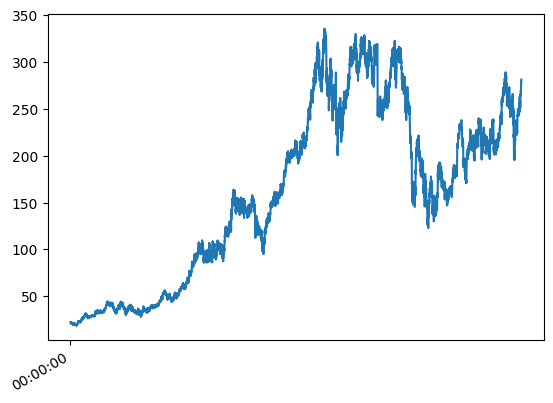

In [89]:
close.plot()

In [90]:
ema_50 = close.ewm(span=50,adjust=False).mean()
ema_50

1970-01-01 00:00:00.000000000     22.445370
1970-01-01 00:00:00.000000001     22.428110
1970-01-01 00:00:00.000000002     22.423034
1970-01-01 00:00:00.000000003     22.406649
1970-01-01 00:00:00.000000004     22.373649
                                    ...    
1970-01-01 00:00:00.000008938    259.687544
1970-01-01 00:00:00.000008939    260.417444
1970-01-01 00:00:00.000008940    261.169701
1970-01-01 00:00:00.000008941    261.857164
1970-01-01 00:00:00.000008942    262.611785
Name: Adj Close, Length: 8942, dtype: float64

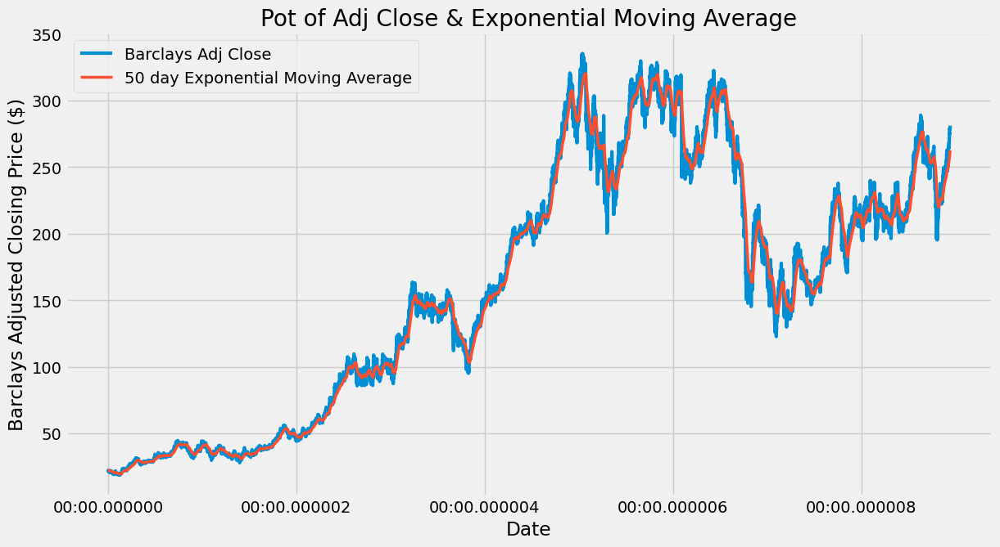

In [91]:
plt.style.use('fivethirtyeight')
plt.figure(figsize = (13,7))
plt.plot(close,label='Barclays Adj Close',linewidth=3)
plt.plot(ema_50,label='50 day Exponential Moving Average',linewidth=2.5)
plt.xlabel('Date')
plt.ylabel('Barclays Adjusted Closing Price ($)')
plt.title('Pot of Adj Close & Exponential Moving Average')
plt.legend()

# Implementing Autoregressive Integrated Moving Average (ARIMA)

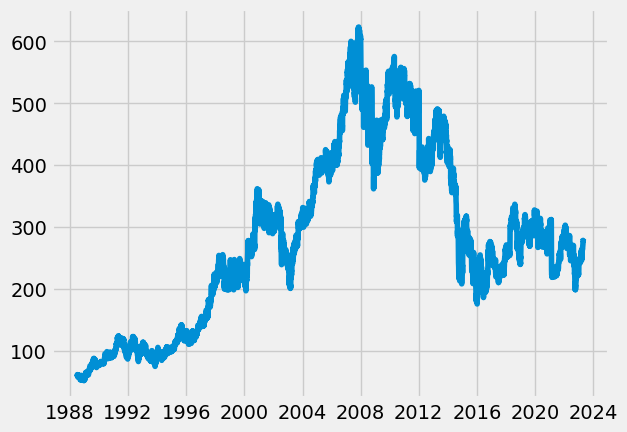

In [92]:
import datetime as dt

x = [dt.datetime.strptime(d,"%Y-%m-%d").date() for d in data["Date"]]
y = data["Close"]

plt.plot(x,y)
plt.show()

# Implementing Capital Assets Pricing Model (CAPM)

<Axes: >

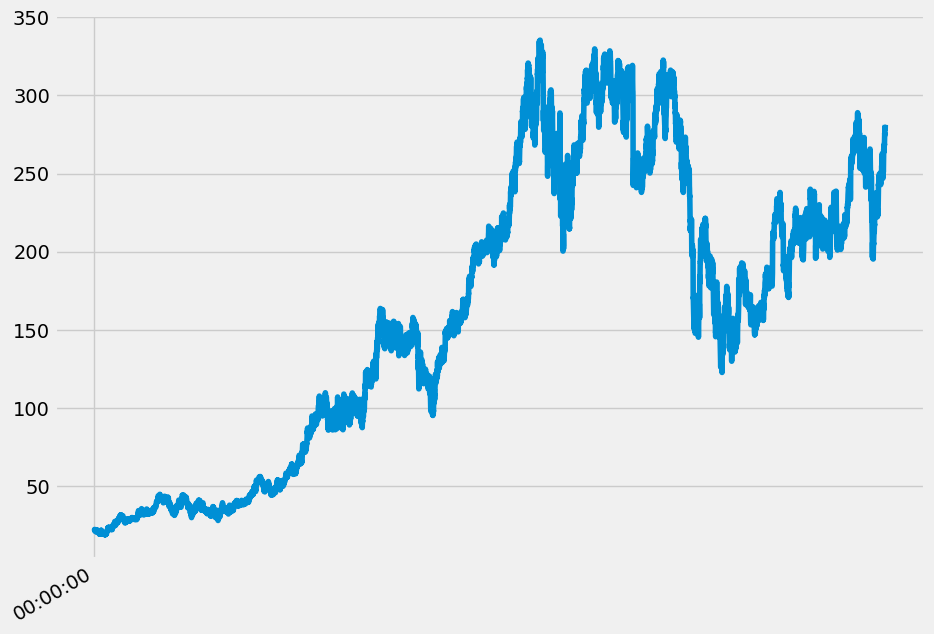

In [95]:
data['Adj Close'].plot(label= 'Barclays', figsize= (10,8))

In [96]:
data['Cumulative'] = data['Adj Close'] / data['Adj Close'].iloc[0]

<Axes: >

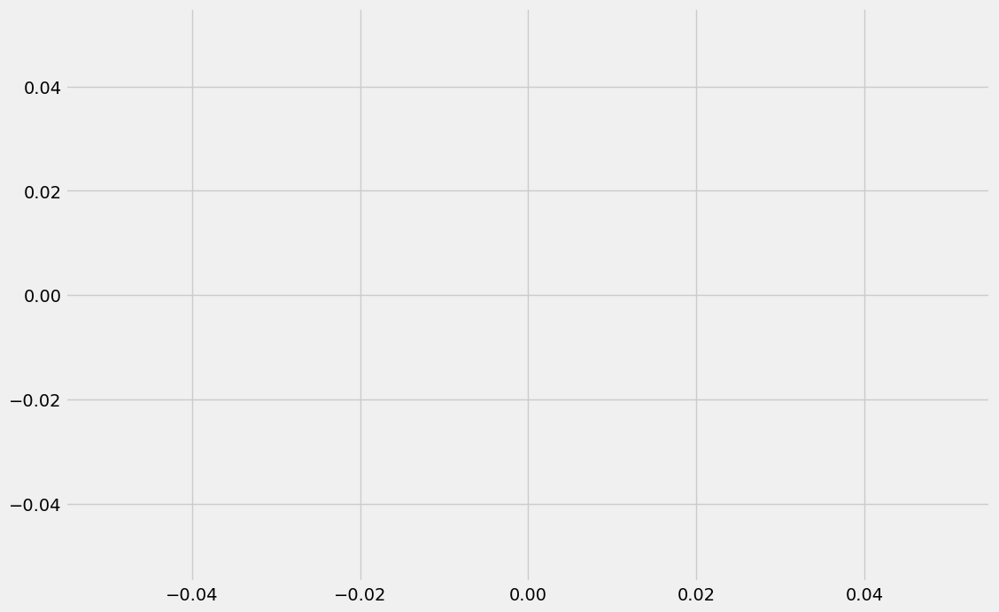

In [97]:
data['Cumulative'].plot(label = 'Barclays', figsize= (12,8))

In [98]:
data['Daily Return'] = data['Adj Close'].pct_change(1)

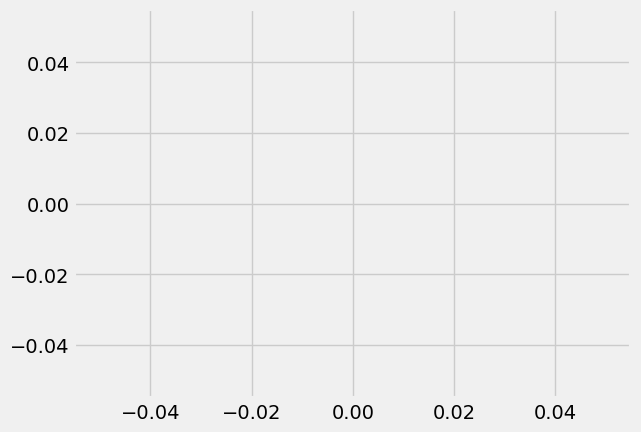

In [99]:
plt.scatter(data['Daily Return'],data['Adj Close'], alpha= 0.25)

In [100]:
from scipy import stats
beta, alpha, r_value, p_value, std_err= stats.linregress(data['Daily Return'].iloc[1:],
                                                        data['Adj Close'].iloc[1:])

print('Beta:', beta)
print('alpha:', alpha)
print('r_value:', r_value)
print('p_value', p_value)
print('std_err', std_err)

Beta: nan
alpha: nan
r_value: nan
p_value nan
std_err nan


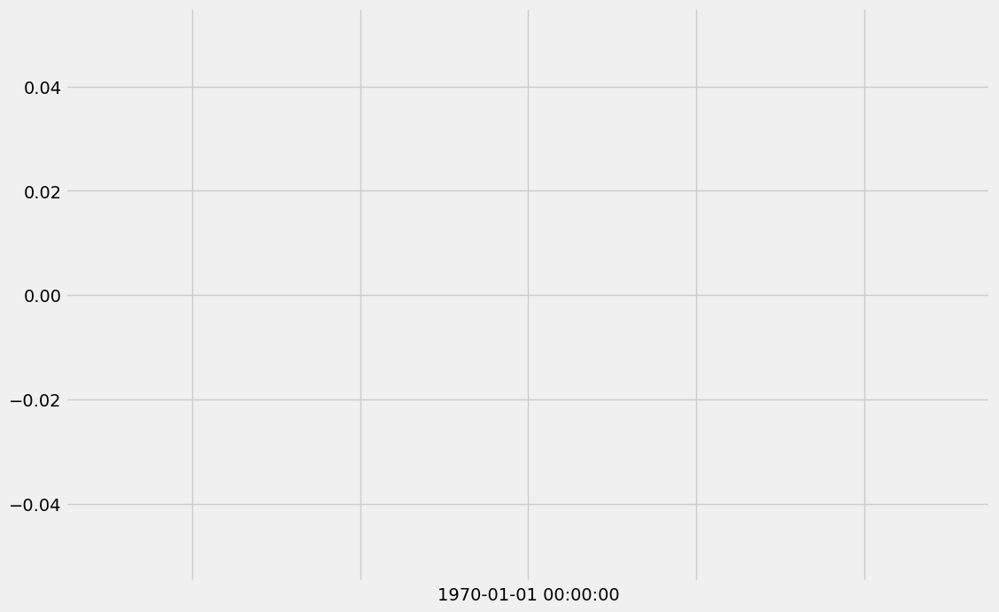

In [101]:
spread = data['Adj Close'] - data['Daily Return']
spread.plot(label= 'Spread', figsize= (12,8))
plt.axhline(spread.mean(), c= 'r')

In [102]:
def zscore(stocks):
    return (stocks-stocks.mean()) / np.std(stocks)

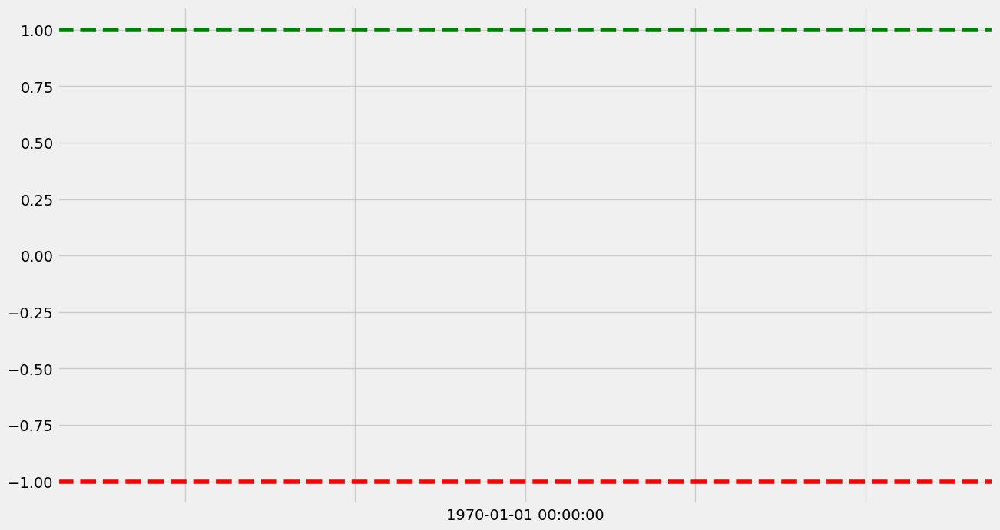

In [103]:
zscore(spread).plot(figsize= (14,8))
plt.axhline(zscore(spread).mean(), color= 'black')
plt.axhline(1.0, c= 'g', ls= '--')
plt.axhline(-1.0, c= 'r', ls= '--')

In [104]:
spread_navg1 = spread.rolling(1).mean()
spread_navg30 = spread.rolling(30).mean()
std_30 = spread.rolling(30).std()
zscore_30_1 = (spread_navg1-spread_navg30)/std_30

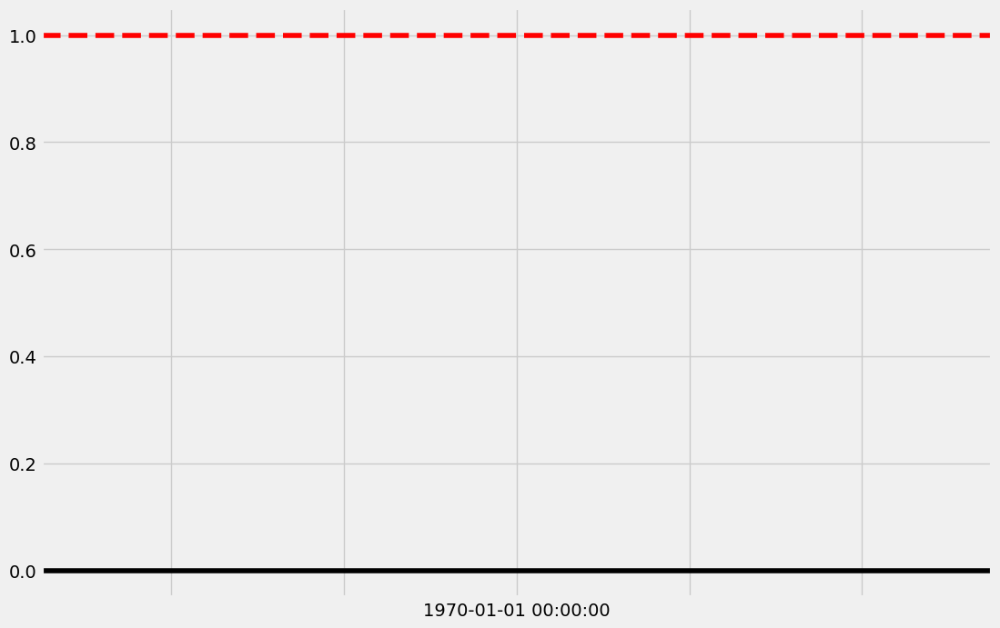

In [105]:
zscore_30_1.plot(figsize= (12,8), label= 'Rolling 30 day Z score')
plt.axhline(0, color= 'black')
plt.axhline(1.0, color='red', ls='--')

# Implementing Auto-Correlation Function (ACF) and Partial Auto-Correlation Function (PACF)

In [106]:
from pandas.plotting import autocorrelation_plot
from pandas.plotting import lag_plot
from statsmodels.tsa.stattools import adfuller, acf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

<Figure size 640x480 with 0 Axes>

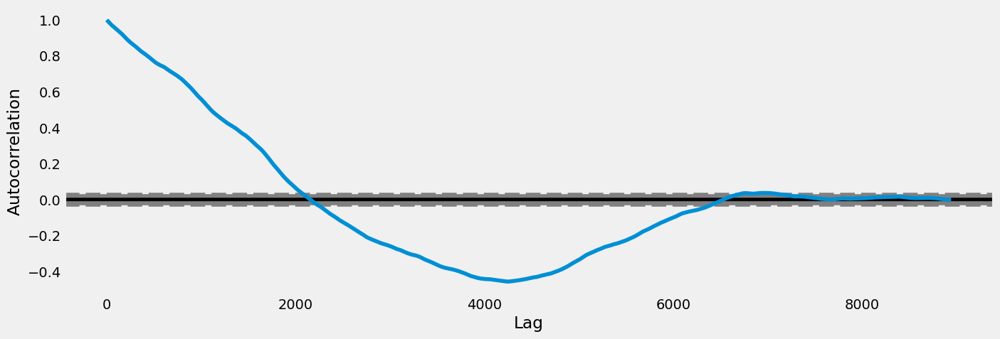

In [107]:
plt.clf()
fig, ax = plt.subplots(figsize=(15, 5))
autocorrelation_plot(data['Close'], ax=ax)

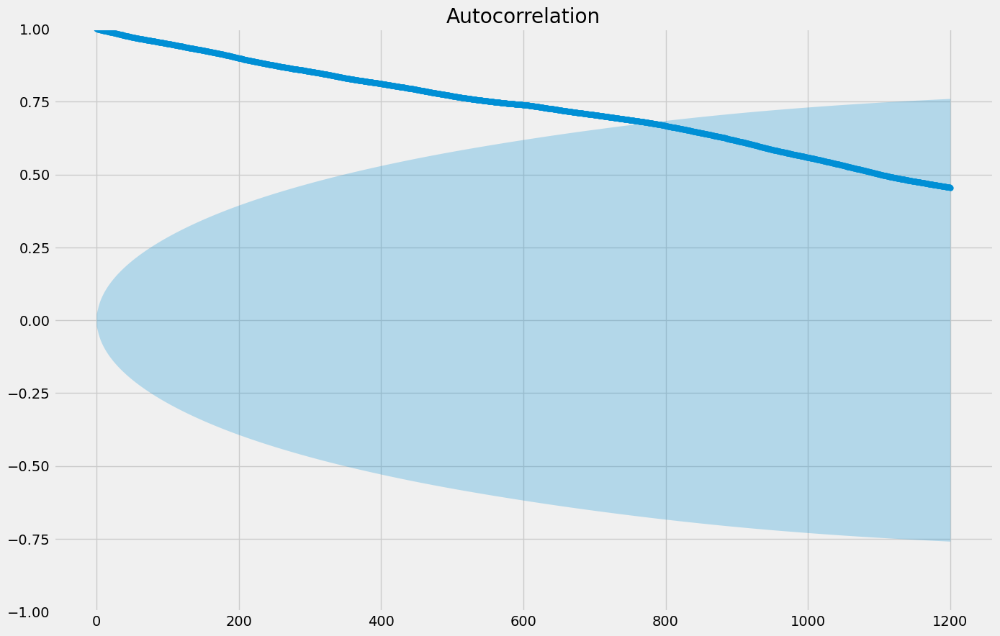

<Figure size 640x480 with 0 Axes>

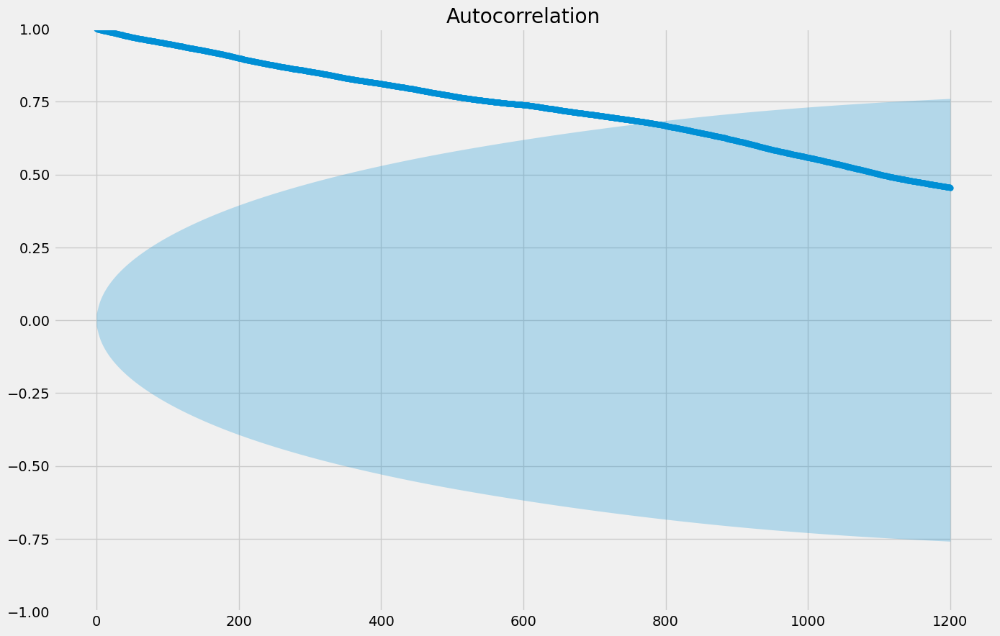

In [108]:
plt.clf()
fig, ax = plt.subplots(figsize=(15, 10))
plot_acf(data['Close'], lags=1200, use_vlines=False, ax=ax)

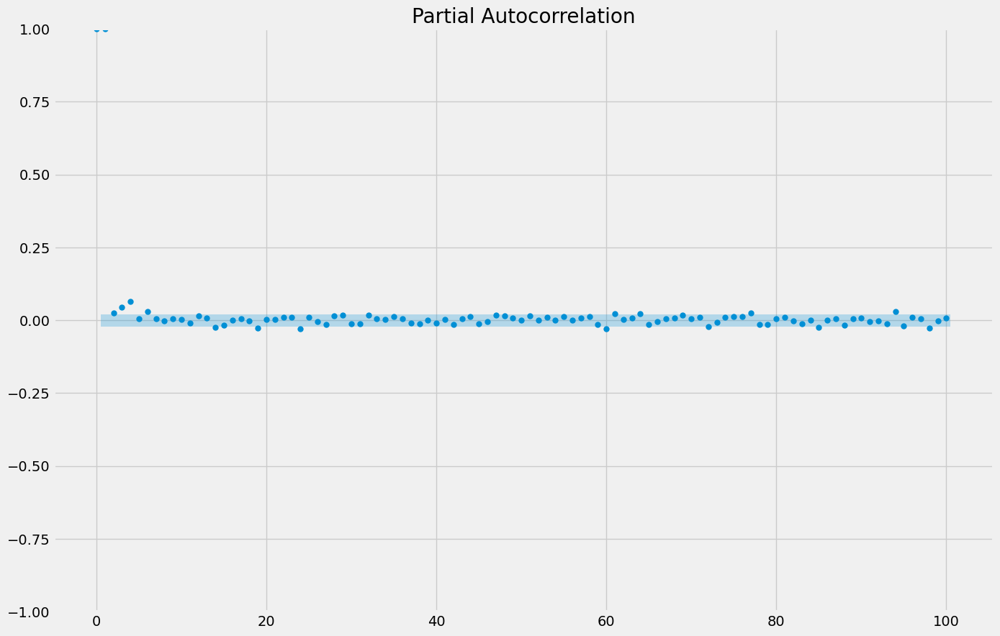

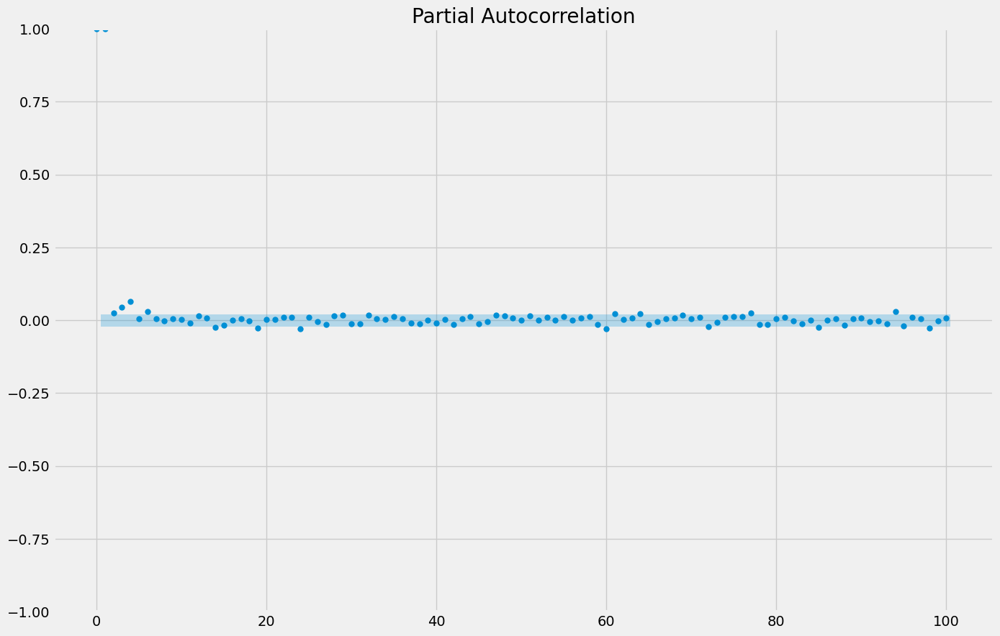

In [109]:
fig, ax = plt.subplots(figsize=(15, 10))
plot_pacf(data['Close'], lags=100, use_vlines=False, ax=ax)

In [110]:
def calculate_acf(series, nlags=100):
    alpha = 0.05
    acf_value, confint, qstat, pvalues, *_ = acf(series,
                                             unbiased=True,
                                             nlags=nlags,
                                             qstat=True,
                                             alpha=alpha)
    for l, p_val in enumerate(pvalues):
        if p_val > alpha:
            print("Null hypothesis is accepted at lag = {} for p-val = {}".format(l, p_val))
        else:
            print("Null hypothesis is rejected at lag = {} for p-val = {}".format(l, p_val))

In [112]:
adf, p_value, usedlag, nobs, critical_values, *values = adfuller(data['Close'])
print ("ADF is ", adf)
print ("p value is ", p_value)
print ("lags used are ", usedlag)
print ("Number of observations are ", nobs)
print ("Critical Values are", critical_values)

ADF is  -1.7989513685868113
p value is  0.38098243414504174
lags used are  5
Number of observations are  8936
Critical Values are {'1%': -3.4310820030733957, '5%': -2.861863497573323, '10%': -2.566942192742442}


# Implementing Time Series forecasting with Prophet

In [113]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [114]:
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [115]:
data['Date']=pd.to_datetime(data['Date'],infer_datetime_format=True,format='%Y-%m-%d')

In [116]:
dat  = data[["Date", "Volume"]]

In [117]:
dat.rename(columns={'Date':'ds','Volume':'y'},inplace=True)

In [118]:
model = Prophet()
model.fit(dat)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp6bn4t5d2/5mclbapl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp6bn4t5d2/0oe0dn93.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64089', 'data', 'file=/tmp/tmp6bn4t5d2/5mclbapl.json', 'init=/tmp/tmp6bn4t5d2/0oe0dn93.json', 'output', 'file=/tmp/tmp6bn4t5d2/prophet_modelg66yc9b4/prophet_model-20230501163330.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:33:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:33:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [119]:
future = model.make_future_dataframe(periods=0, freq='M')
future.tail()

,ds
8937,2023-04-24
8938,2023-04-25
8939,2023-04-26
8940,2023-04-27
8941,2023-04-28


In [120]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
8937,2023-04-24,1.860085e+07,-1.322948e+07,5.066465e+07
8938,2023-04-25,2.317419e+07,-6.949672e+06,5.671728e+07
8939,2023-04-26,2.367244e+07,-1.086600e+07,5.362005e+07
8940,2023-04-27,2.312571e+07,-1.078271e+07,5.588641e+07
8941,2023-04-28,2.481516e+07,-7.947149e+06,5.655472e+07


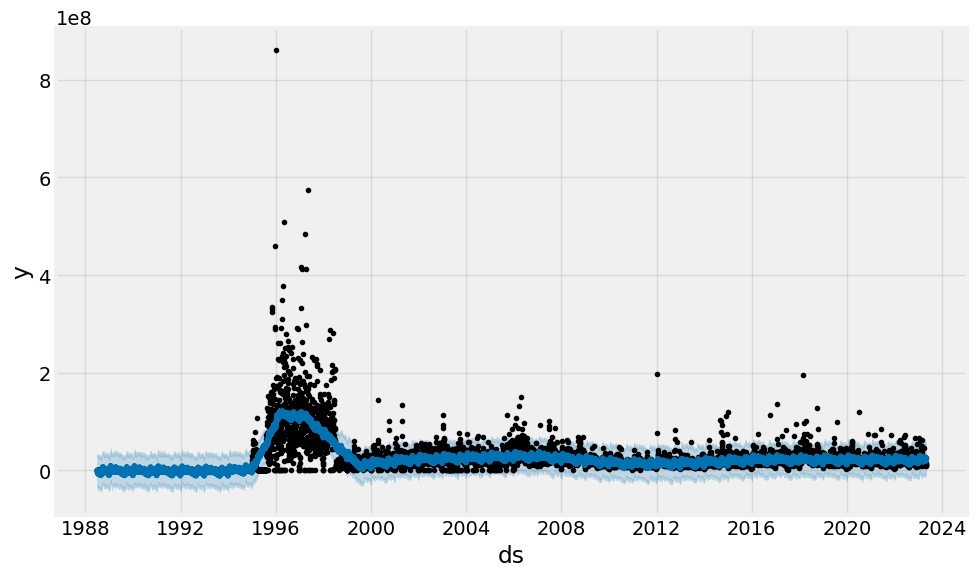

In [121]:
fig1 = model.plot(forecast)

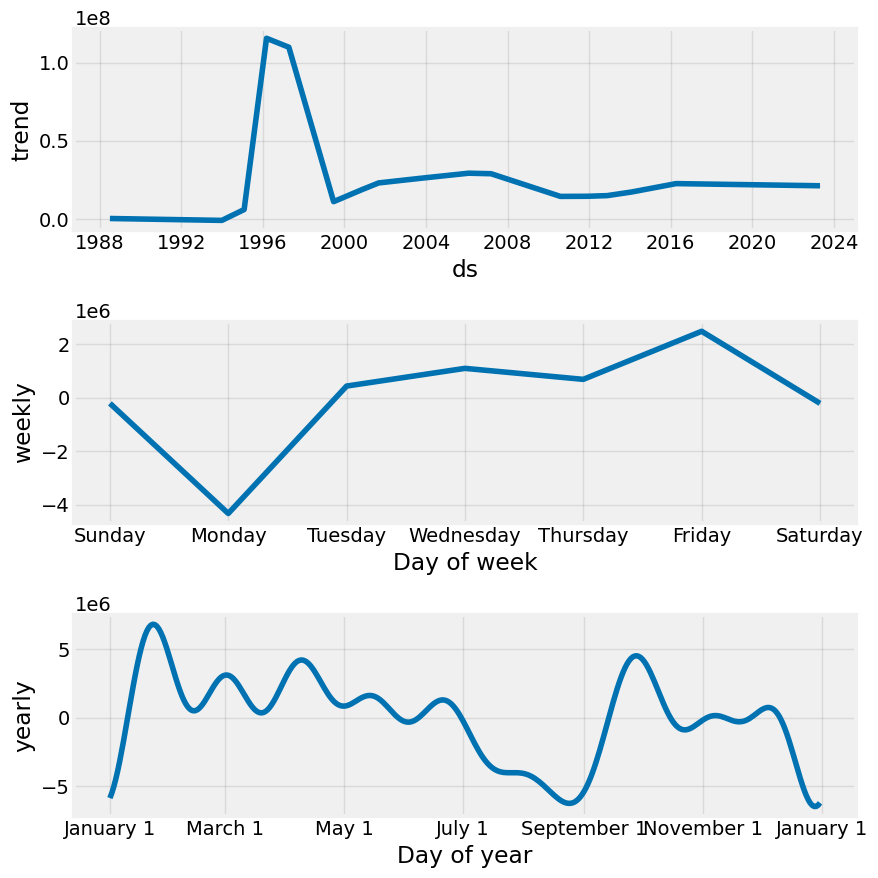

In [122]:
fig2 = model.plot_components(forecast)

In [123]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model, forecast)

In [124]:
plot_components_plotly(model, forecast)